In [20]:
%reset -f

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.utils import shuffle

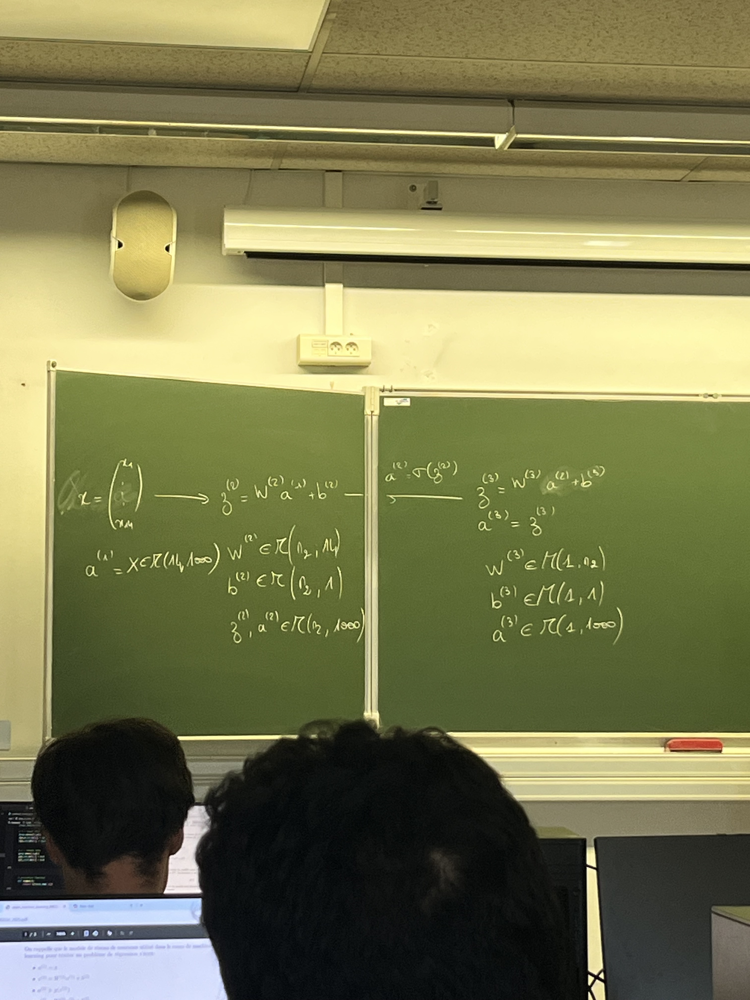

In [21]:
# lecture des données

df = pd.read_csv('student_habits_performance.csv')
df = pd.DataFrame(df)
df.head()

,student_id,age,gender,study_hours_per_day,social_media_hours,netflix_hours,part_time_job,attendance_percentage,sleep_hours,diet_quality,exercise_frequency,parental_education_level,internet_quality,mental_health_rating,extracurricular_participation,exam_score
0,S1000,23,Female,0.0,1.2,1.1,No,85.0,8.0,Fair,6,Master,Average,8,Yes,56.2
1,S1001,20,Female,6.9,2.8,2.3,No,97.3,4.6,Good,6,High School,Average,8,No,100.0
2,S1002,21,Male,1.4,3.1,1.3,No,94.8,8.0,Poor,1,High School,Poor,1,No,34.3
3,S1003,23,Female,1.0,3.9,1.0,No,71.0,9.2,Poor,4,Master,Good,1,Yes,26.8
4,S1004,19,Female,5.0,4.4,0.5,No,90.9,4.9,Fair,3,Master,Good,1,No,66.4


In [22]:
# supprime la colonne "student_id"
df = df.drop('student_id', axis=1)
df.head()

,age,gender,study_hours_per_day,social_media_hours,netflix_hours,part_time_job,attendance_percentage,sleep_hours,diet_quality,exercise_frequency,parental_education_level,internet_quality,mental_health_rating,extracurricular_participation,exam_score
0,23,Female,0.0,1.2,1.1,No,85.0,8.0,Fair,6,Master,Average,8,Yes,56.2
1,20,Female,6.9,2.8,2.3,No,97.3,4.6,Good,6,High School,Average,8,No,100.0
2,21,Male,1.4,3.1,1.3,No,94.8,8.0,Poor,1,High School,Poor,1,No,34.3
3,23,Female,1.0,3.9,1.0,No,71.0,9.2,Poor,4,Master,Good,1,Yes,26.8
4,19,Female,5.0,4.4,0.5,No,90.9,4.9,Fair,3,Master,Good,1,No,66.4


In [23]:
# ... on décide de les remplacer par la valeur la plus fréquente
df['parental_education_level'] = df['parental_education_level'].fillna(df['parental_education_level'].mode()[0])

In [24]:
# remplace les données catégorielles par des donées numériques
le = LabelEncoder()
df['gender'] = le.fit_transform(df['gender'])
df['part_time_job'] = le.fit_transform(df['part_time_job'])
df['diet_quality'] = le.fit_transform(df['diet_quality'])
df['parental_education_level'] = le.fit_transform(df['parental_education_level'])
df['internet_quality'] = le.fit_transform(df['internet_quality'])
df['extracurricular_participation'] = le.fit_transform(df['extracurricular_participation'])
df.head()

,age,gender,study_hours_per_day,social_media_hours,netflix_hours,part_time_job,attendance_percentage,sleep_hours,diet_quality,exercise_frequency,parental_education_level,internet_quality,mental_health_rating,extracurricular_participation,exam_score
0,23,0,0.0,1.2,1.1,0,85.0,8.0,0,6,2,0,8,1,56.2
1,20,0,6.9,2.8,2.3,0,97.3,4.6,1,6,1,0,8,0,100.0
2,21,1,1.4,3.1,1.3,0,94.8,8.0,2,1,1,2,1,0,34.3
3,23,0,1.0,3.9,1.0,0,71.0,9.2,2,4,2,1,1,1,26.8
4,19,0,5.0,4.4,0.5,0,90.9,4.9,0,3,2,1,1,0,66.4


In [25]:
# place les données dans des numpy arrays X et y

data = np.array(df)
data = shuffle(data)

X = data[:,0:14].T
y = data[:,-1].reshape((1,1000))


# Question 1

X est de dimension 14 ligne et 1000 colonnes


In [26]:
X_train = data[0:900,0:14].T
y_train = data[0:900,-1]
print(y_train.shape)

X_test = data[900:,0:14].T
y_test = data[900:,-1]

(900,)


In [27]:
min = np.min(X_train, axis=1)
print(min)
max = np.max(X_train, axis=1)

X_train = ((X_train.T-min)/(max-min)).T

X_test = ((X_test.T-min)/max-min).T

m = y.shape[1]
n2 = 20
alpha = 0.2
Niter = 800

[17.   0.   0.   0.   0.   0.  56.7  3.2  0.   0.   0.   0.   1.   0. ]


In [28]:
def sigma(z):
    return 1/(1 + np.exp(-z))

In [29]:
def sigma_prim(z):
    return np.exp(-z)/((1+np.exp(-z))**2)

In [30]:
W2 = np.random.randn(n2,14)
b2 = np.random.randn(n2,1)

W3 = np.random.randn(1,n2)
b3 = np.random.randn(1,1)

In [31]:
def compute_grad(x,y,W2,W3,b2,b3):
    A1 = x

    Z2 = W2@A1 + b2
    A2 = sigma(Z2)

    Z3 = W3@A2 + b3
    A3 = Z3

    delta_3 = A3-y
    delta_2 = (np.transpose(W3)@delta_3)*sigma_prim(Z2)

    dC_W2 = (1/m)*delta_2@np.transpose(A1)
    dC_W3 = (1/m)*delta_3@np.transpose(A2)
    
    dC_b2 = (1/m)*np.sum(delta_2, axis=1).reshape((n2,1))
    dC_b3 = (1/m)*np.sum(delta_3, axis=1).reshape((1,1))
    
    return dC_W2, dC_W3, dC_b2, dC_b3

In [32]:
def cost(y,y_pred):

    C = np.linalg.norm(y-y_pred)/np.size(y)
    
    return C

In [33]:
def model_predict(X,W2,W3,b2,b3):
    
    A1 = X

    Z2 = W2@A1 + b2
    A2 = sigma(Z2)

    Z3 = W3@A2 + b3
    A3 = Z3
    
    return A3

In [34]:
# Main program

Cost = np.zeros(Niter)

for j in range(Niter):
    
    y_pred = model_predict(X_train,W2,W3,b2,b3)
    Cost[j] = cost(y_train,y_pred)
        
    dC_dW2,dC_dW3,dC_db2,dC_db3 = compute_grad(X_train,y_train,W2,W3,b2,b3)

    W2 = W2 - alpha*dC_dW2
    W3 = W3 - alpha*dC_dW3
    b2 = b2 - alpha*dC_db2
    b3 = b3 - alpha*dC_db3

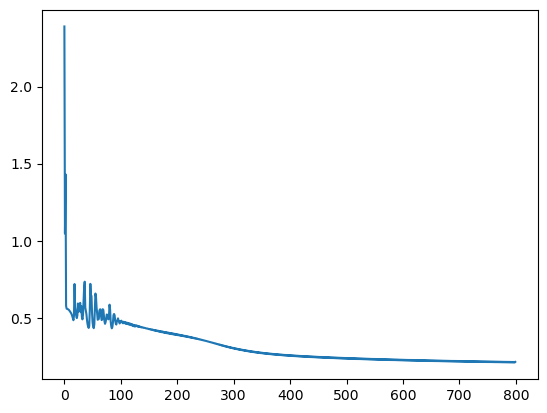

In [35]:
plt.plot(Cost)

In [36]:
y_pred = model_predict(X_test,W2,W3,b2,b3)
print('MSE sur les données test:', cost(y_test,y_pred))

MSE sur les données test: 1.7471962139859725
